In [154]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

## Pra-processing

### Membaca citra dataset ORL

In [155]:
datasetFaces = []

for person in range(1,41):
    temp = []
    
    for pose in range(1,11):
        data = plt.imread('/Users/iamapinn/Developer/UTS Pengolahan CITRA/ORL/'+str(person)+'/ORL_'+str(person)+'_'+str(pose)+'.jpg')
        temp.append(data)
        
    datasetFaces.append(np.array(temp))

datasetFaces = np.array(datasetFaces)
np.save('datasetFacesORL.npy', datasetFaces)

print('Jumlah total dataset:', len(datasetFaces))
print('Ukuran dataset:', datasetFaces.shape)

Jumlah total dataset: 40
Ukuran dataset: (40, 10, 112, 92)


### Visualisasi Dataset

#### Visualisasi semua datasets Person

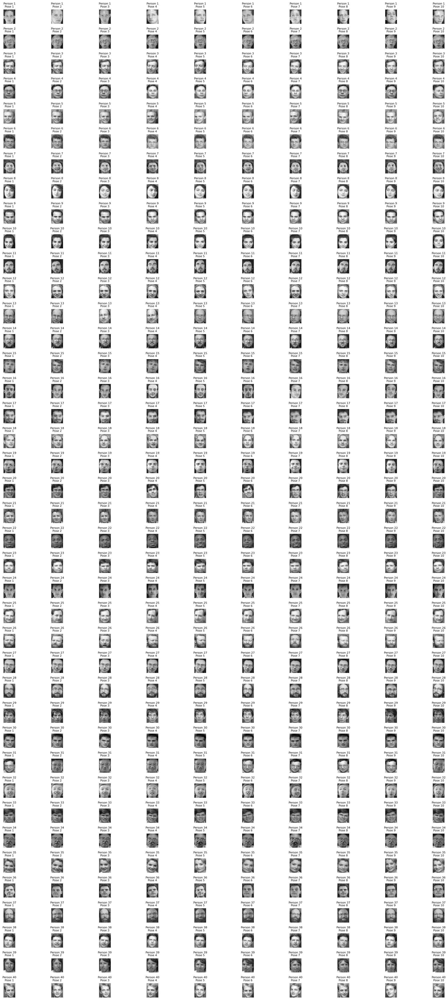

In [156]:
fig, axes = plt.subplots(datasetFaces.shape[0], datasetFaces.shape[1], figsize=(20, 40))

for person in range(datasetFaces.shape[0]):
    for pose in range(datasetFaces.shape[1]):
        axes[person, pose].imshow(datasetFaces[person, pose], cmap='gray')
        axes[person, pose].axis('off')
        axes[person, pose].set_title(f'Person {person + 1}\nPose {pose + 1}', fontsize=8)

plt.tight_layout()
plt.show()

#### Visualisasi Person

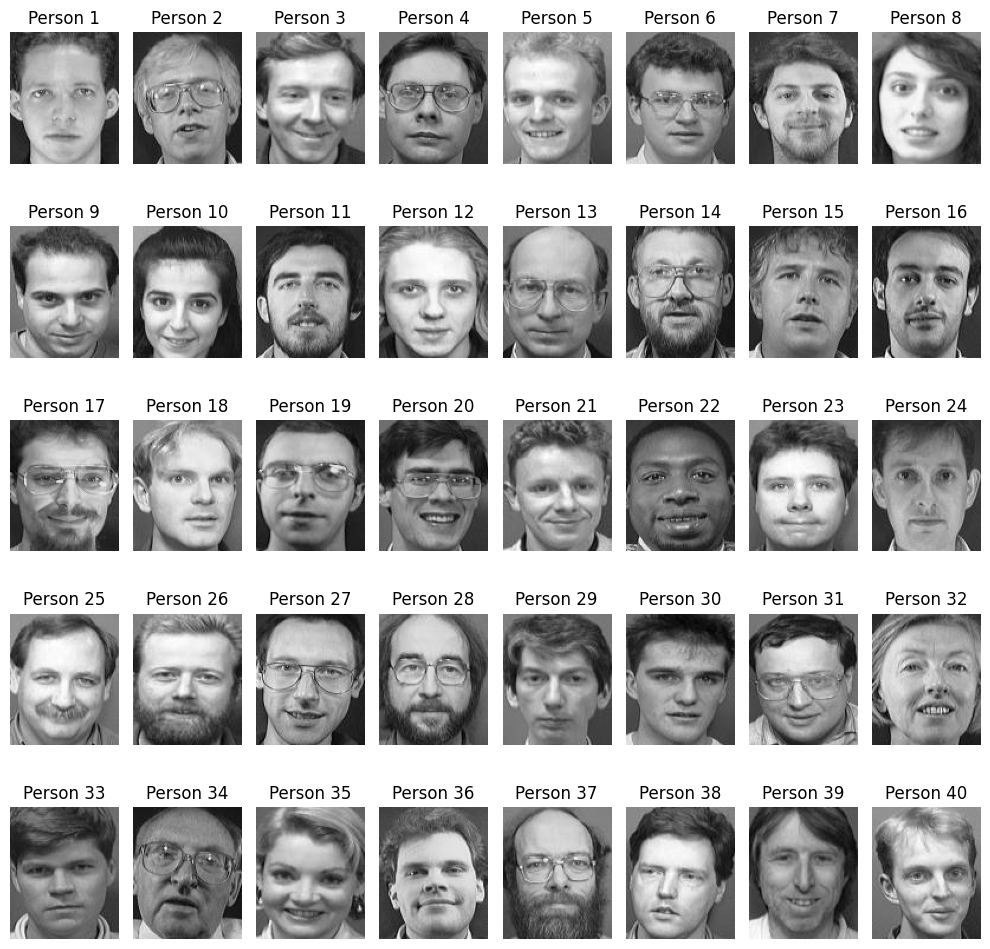

In [157]:
plt.figure(figsize=(10,10))

for person in range(datasetFaces.shape[0]):
    plt.subplot(5, 8, person+1)
    plt.imshow(datasetFaces[person][0], cmap='gray')
    plt.title('Person '+str(person+1))
    plt.axis('off')

plt.tight_layout()
plt.show()

## Processing

### Ekstraksi Fitur menggunakan Principal Component Analysis (PCA) yaitu mereduksi jumlah dimensi yang tinggi ke dimensi yang lebih rendah

#### 1. Pembagian data train dan test

<p>Langkah pertama yang dilakukan
adalah membagi data citra menjadi data train dan data test.</p>

In [159]:
train_size = 0.6  # Split Data dengan pengambilan random

train_idx = np.random.choice(10, int(train_size*10), replace=False)
test_idx =  np.array(list(set(range(10)) - set(train_idx)))

train = []
test = []
for person in range(datasetFaces.shape[0]):
    for poses in range(datasetFaces.shape[1]):
        if poses in train_idx:
            train.append(datasetFaces[person][poses].flatten())
        else:
            test.append(datasetFaces[person][poses].flatten())
            
train = np.array(train)
test = np.array(test)

print('Indeks Data Train:', train_idx)
print('Indeks Data Test:', test_idx)
print('Ukuran train:', train.shape)
print('Ukuran test:', test.shape)

Indeks Data Train: [5 0 8 4 9 7]
Indeks Data Test: [1 2 3 6]
Ukuran train: (240, 10304)
Ukuran test: (160, 10304)


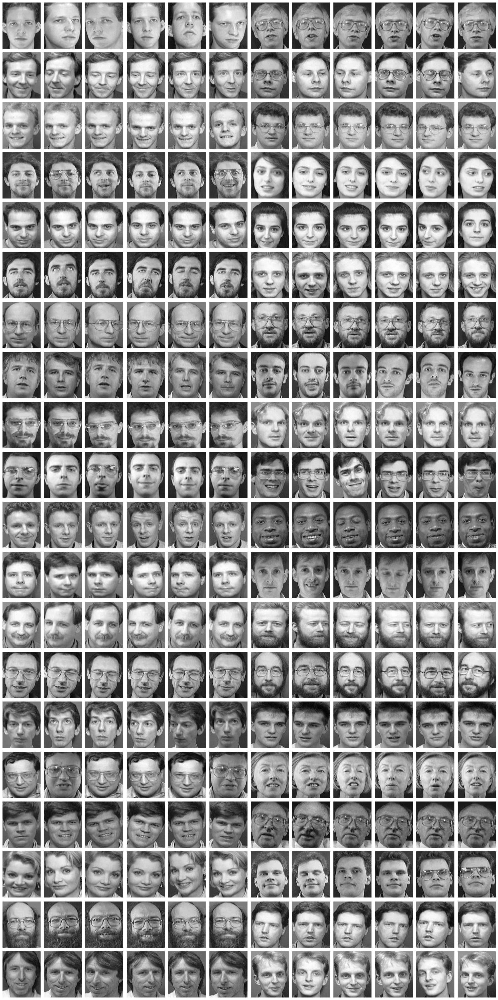

In [160]:
plt.figure(figsize=(20, 40))

# plot train data
for person in range(train.shape[0]):
    plt.subplot(20, 12, person + 1)  # Adjusted to 20 rows and 12 columns
    plt.imshow(train[person].reshape(112, 92), cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

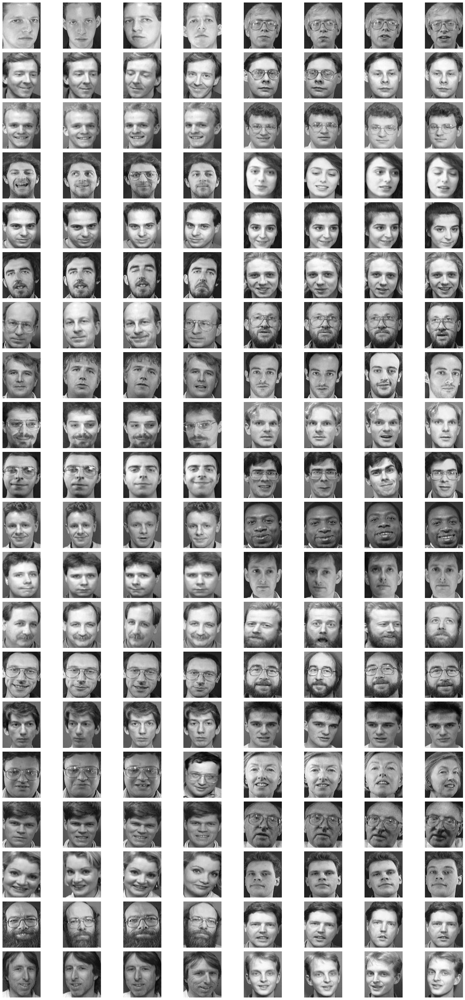

In [161]:
plt.figure(figsize=(20, 40))

# plot test data
for person in range(test.shape[0]):
    plt.subplot(20, 8, person + 1)  # Adjusted to 20 rows and 12 columns
    plt.imshow(test[person].reshape(112, 92), cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

#### 2. Pencarian rata-rata (Mean)

<p>Setelah pembagian data train dan test, maka proses selanjutnya adalah
mencari nilai mean dari seluruh citra.
Hal ini bertujuan untuk untuk
mengetahui noise yang dapat
mengurangi tingkat keakuratan didalam
perhitungan PCA</p>

In [162]:
meanTrain = np.mean(train, axis=0)

print('Ukuran Mean Train:', meanTrain.shape)

dfMeanTrain = pd.DataFrame(meanTrain)
dfMeanTrain

Ukuran Mean Train: (10304,)


,0
0,86.016667
1,85.954167
2,85.800000
3,86.116667
4,86.187500
...,...
10299,77.733333
10300,79.200000
10301,79.491667
10302,77.375000


#### 3. Penggandaan nilai rata-rata atau pembentukan dimensi mean baru. 

<p>Pengandaan nilai rata-rata dilakukan
untuk menyamakan dimensi nilai ratarata dengan dimensi data citra sampel
sebanyak m, sehingga rata-rata seluruh
citra data sampel memiliki dimensi
(mxn)</p>

In [163]:
meanGandaTrain = np.zeros(train.shape)
meanGandaTrain[:, :] = meanTrain

print('Ukuran Mean Ganda Train:', meanGandaTrain.shape)

dfMeanGandaTrain = pd.DataFrame(meanGandaTrain)
dfMeanGandaTrain

Ukuran Mean Ganda Train: (240, 10304)


,0,1,2,3,4,5,6,7,8,9,...,10294,10295,10296,10297,10298,10299,10300,10301,10302,10303
0,86.016667,85.954167,85.8,86.116667,86.1875,86.241667,86.275,86.170833,86.029167,86.029167,...,82.6625,82.1625,79.95,81.7625,79.991667,77.733333,79.2,79.491667,77.375,77.270833
1,86.016667,85.954167,85.8,86.116667,86.1875,86.241667,86.275,86.170833,86.029167,86.029167,...,82.6625,82.1625,79.95,81.7625,79.991667,77.733333,79.2,79.491667,77.375,77.270833
2,86.016667,85.954167,85.8,86.116667,86.1875,86.241667,86.275,86.170833,86.029167,86.029167,...,82.6625,82.1625,79.95,81.7625,79.991667,77.733333,79.2,79.491667,77.375,77.270833
3,86.016667,85.954167,85.8,86.116667,86.1875,86.241667,86.275,86.170833,86.029167,86.029167,...,82.6625,82.1625,79.95,81.7625,79.991667,77.733333,79.2,79.491667,77.375,77.270833
4,86.016667,85.954167,85.8,86.116667,86.1875,86.241667,86.275,86.170833,86.029167,86.029167,...,82.6625,82.1625,79.95,81.7625,79.991667,77.733333,79.2,79.491667,77.375,77.270833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,86.016667,85.954167,85.8,86.116667,86.1875,86.241667,86.275,86.170833,86.029167,86.029167,...,82.6625,82.1625,79.95,81.7625,79.991667,77.733333,79.2,79.491667,77.375,77.270833
236,86.016667,85.954167,85.8,86.116667,86.1875,86.241667,86.275,86.170833,86.029167,86.029167,...,82.6625,82.1625,79.95,81.7625,79.991667,77.733333,79.2,79.491667,77.375,77.270833
237,86.016667,85.954167,85.8,86.116667,86.1875,86.241667,86.275,86.170833,86.029167,86.029167,...,82.6625,82.1625,79.95,81.7625,79.991667,77.733333,79.2,79.491667,77.375,77.270833
238,86.016667,85.954167,85.8,86.116667,86.1875,86.241667,86.275,86.170833,86.029167,86.029167,...,82.6625,82.1625,79.95,81.7625,79.991667,77.733333,79.2,79.491667,77.375,77.270833


#### 4. Perhitungan nilai rata-rata nol atau Zero Mean

<p>Perhitungan nilai rata-rata nol,
berfungsi untuk menghilangkan noise
yang dapat menganggu keakuratan
pada perhitungan PCA.</p>

In [164]:
zeroMeanTrain = train - meanGandaTrain

print('Ukuran Zero Mean Train:', zeroMeanTrain.shape)

dfZeroMeanTrain = pd.DataFrame(zeroMeanTrain)
dfZeroMeanTrain

Ukuran Zero Mean Train: (240, 10304)


,0,1,2,3,4,5,6,7,8,9,...,10294,10295,10296,10297,10298,10299,10300,10301,10302,10303
0,-38.016667,-32.954167,-42.8,-43.116667,-27.1875,-35.241667,-47.275,-38.170833,-32.029167,-38.029167,...,-43.6625,-42.1625,-37.95,-37.7625,-33.991667,-30.733333,-33.2,-33.491667,-31.375,-31.270833
1,-23.016667,-10.954167,-10.8,-30.116667,-44.1875,-37.241667,-22.275,-13.170833,-24.029167,-36.029167,...,-52.6625,-52.1625,-48.95,-49.7625,-46.991667,-44.733333,-42.2,-41.491667,-39.375,-38.270833
2,-47.016667,-22.954167,-61.8,-22.116667,-5.1875,-8.241667,-17.275,-40.170833,-29.029167,-51.029167,...,85.3375,83.8375,84.05,79.2375,77.008333,76.266667,75.8,79.508333,68.625,96.729167
3,-37.016667,-46.954167,-54.8,-57.116667,-55.1875,-55.241667,-53.275,-50.170833,-42.029167,-25.029167,...,-39.6625,-39.1625,-39.95,-45.7625,-46.991667,-45.733333,-37.2,-38.491667,-38.375,-40.270833
4,-45.016667,-45.954167,-44.8,-44.116667,-43.1875,-43.241667,-46.275,-48.170833,-55.029167,-48.029167,...,-42.6625,-45.1625,-43.95,-42.7625,-38.991667,-38.733333,-34.2,-35.491667,-34.375,-34.270833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,40.983333,41.045833,41.2,41.883333,41.8125,42.758333,42.725,42.829167,40.970833,39.970833,...,5.3375,5.8375,10.05,8.2375,9.008333,10.266667,7.8,7.508333,9.625,8.729167
236,38.983333,37.045833,36.2,36.883333,38.8125,39.758333,38.725,36.829167,38.970833,38.970833,...,-47.6625,-46.1625,-41.95,-42.7625,-41.991667,-40.733333,-41.2,-40.491667,-37.375,-36.270833
237,36.983333,36.045833,35.2,35.883333,37.8125,38.758333,37.725,36.829167,34.970833,34.970833,...,-47.6625,-48.1625,-45.95,-46.7625,-43.991667,-40.733333,-39.2,-39.491667,-37.375,-38.270833
238,32.983333,33.045833,33.2,32.883333,32.8125,32.758333,32.725,32.829167,34.970833,32.970833,...,-15.6625,7.8375,9.05,17.2375,13.008333,18.266667,13.8,12.508333,13.625,12.729167


#### 5. Pembentukan matrik kovarian

<p>Hasil perhitungan nilai rata-rata nol
digunakan untuk mendapatkan nilai
matriks kovarian. Berikut ini adalah
persamaan matriks kovarian:</p>

\begin{equation}
c=\frac{1}{m-1} \phi_{j i} * \phi^T{ }_{j i}
\end{equation}

In [165]:
covMatrikTrain = (1 / (train.shape[0] - 1)) * (np.dot(zeroMeanTrain, zeroMeanTrain.T))

print('Ukuran Covariance Matrik Train:', covMatrikTrain.shape)

dfCovTrain = pd.DataFrame(covMatrikTrain)
dfCovTrain

Ukuran Covariance Matrik Train: (240, 240)


,0,1,2,3,4,5,6,7,8,9,...,230,231,232,233,234,235,236,237,238,239
0,58886.823953,29447.561836,31888.063667,39920.402579,30292.199424,26918.645152,14142.420954,18336.598186,13783.356920,13594.621216,...,-32482.345032,-29274.609642,-36278.631835,-29523.263948,-5090.547682,5273.785424,713.480630,-100.712240,7958.828747,-6023.812867
1,29447.561836,110983.358297,51943.676028,68641.989835,81476.698813,65596.232408,17113.836662,19703.151969,4051.119908,15931.522279,...,-44770.042295,-39002.072595,-51453.408596,-43375.509328,18243.395222,16843.213684,11506.779183,14134.339451,26703.407635,3621.941753
2,31888.063667,51943.676028,98929.654845,38688.416352,47331.740393,25514.198674,12511.782007,18552.214469,3470.571530,10520.806537,...,-33534.766406,-38306.600053,-44769.417226,-34110.363146,3767.411697,17881.108820,1026.209884,735.368479,32098.198168,3822.928939
3,39920.402579,68641.989835,38688.416352,95115.136017,77440.008175,55146.349302,21069.371965,19782.427858,5681.630107,19838.777248,...,-39886.703645,-32872.792522,-45232.099234,-36113.371514,14306.558140,8260.330578,8148.774737,12611.941700,15902.599842,-8133.765622
4,30292.199424,81476.698813,47331.740393,77440.008175,116285.382426,56456.945309,12891.139521,16324.115916,-2505.970538,9264.239364,...,-41654.392156,-34061.769736,-47938.406992,-37370.470067,18847.827788,14053.244577,10392.420954,13465.182060,19319.459448,-1008.604761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,5273.785424,16843.213684,17881.108820,8260.330578,14053.244577,8126.531310,-9233.722177,-8381.222770,-10487.325960,-6486.471706,...,-28510.626239,-16704.367836,-16031.896305,-24057.909171,13996.522576,42450.374511,15460.258001,15004.772244,23597.099842,14659.169525
236,713.480630,11506.779183,1026.209884,8148.774737,10392.420954,6690.147018,-5968.905632,-3490.184468,-6673.768830,-2405.512902,...,-9968.981242,-5328.291877,-5163.284781,-9037.670032,29027.326568,15460.258001,53492.141491,39727.793810,6154.150696,28585.969333
237,-100.712240,14134.339451,735.368479,12611.941700,13465.182060,14093.046198,-6820.320259,-4947.620015,-8551.317348,-4448.371044,...,-12161.132271,-1656.438721,-6551.356312,-11661.126500,35576.368008,15004.772244,39727.793810,53615.328974,7164.346948,22558.521233
238,7958.828747,26703.407635,32098.198168,15902.599842,19319.459448,12117.223168,2649.898552,-315.016267,-8996.085984,-380.026710,...,-22055.089192,-14511.839157,-18395.576832,-19056.150367,8429.737447,23597.099842,6154.150696,7164.346948,57572.335633,11464.823726


#### 6. Penentuan matriks eigenvalue dan eigenvector

<p>Setelah matriks kovarian didapatkan maka langkah selanjutnya adalah menentukan matriks eigenvalue dan matriks eigenvector. Matriks eigen dapat dicari menggunakan persamaan: </p>

\begin{equation}
\begin{gathered}
C-Z=|C-\lambda I| \\
|C-\lambda I|=0
\end{gathered}
\end{equation}

<p>Dimana C adalah matriks kovarian. Z adalah matriks eigenvalue dengan 𝜆 sebagai scalar pembentuknya dan I sebagai matriks identitas.</p>

In [166]:
eigenValue, eigenVector = np.linalg.eig(covMatrikTrain)

print('Ukuran Eigen Value:', eigenValue.shape)

dfEigenValue = pd.DataFrame(eigenValue)
dfEigenValue

Ukuran Eigen Value: (240,)


,0
0,2.740176e+06
1,2.162274e+06
2,1.116608e+06
3,8.913400e+05
4,8.031711e+05
...,...
235,8.652380e+03
236,8.145210e+03
237,8.106597e+03
238,8.775594e+03


In [167]:
print('Ukuran Eigen Vector:', eigenVector.shape)

dfEigenVector = pd.DataFrame(eigenVector)
dfEigenVector

Ukuran Eigen Vector: (240, 240)


,0,1,2,3,4,5,6,7,8,9,...,230,231,232,233,234,235,236,237,238,239
0,0.065099,0.028574,-0.112277,-0.030848,-6.103437e-02,0.007117,-0.007412,0.062087,-0.010487,0.120097,...,0.103958,0.012531,0.003097,0.008053,0.005898,0.026694,0.018877,-0.005856,0.006718,-0.000052
1,0.145361,0.008092,0.023160,-0.133858,-5.881778e-02,0.045158,0.045704,0.050506,-0.032436,0.002127,...,-0.075417,0.013221,-0.023950,0.001525,0.040780,-0.004658,-0.039557,0.064040,-0.066196,-0.014497
2,0.100982,0.033279,0.014989,-0.079849,-1.610625e-01,0.012662,-0.123688,0.030780,-0.080984,0.031769,...,0.006816,-0.087929,-0.045636,0.094116,0.080935,-0.073703,-0.023344,-0.027025,-0.075375,0.074880
3,0.113693,-0.008337,-0.030307,-0.153844,4.217411e-02,0.087740,0.002848,0.073341,-0.034587,0.138727,...,0.007343,-0.192115,-0.064852,0.005613,-0.051246,0.060606,0.006291,0.117145,-0.089150,-0.089434
4,0.115929,0.029681,0.013131,-0.171564,4.639297e-07,0.127723,0.049075,0.085167,-0.066349,0.044074,...,-0.067282,0.004162,0.055107,-0.001757,-0.098813,-0.007211,0.045348,-0.077547,0.030276,0.020523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,0.055726,0.056328,0.050473,0.049739,-1.015785e-03,0.017863,-0.093977,0.018206,0.066377,-0.035351,...,-0.108602,-0.046455,-0.039474,0.190586,-0.021609,-0.061386,0.032015,-0.024570,-0.037633,-0.163960
236,0.032491,0.038441,0.089480,0.054299,-1.103065e-03,0.033943,0.117429,-0.072016,0.065196,0.114202,...,-0.100705,-0.041489,0.072418,-0.017403,-0.013077,0.012043,-0.017805,0.014511,-0.004104,0.090596
237,0.039638,0.032052,0.091878,0.028186,3.545796e-02,0.015419,0.082698,-0.045942,0.084259,0.112099,...,0.018268,0.050107,-0.081085,-0.107967,0.070185,0.020208,0.011826,-0.011291,0.116229,0.012260
238,0.061336,0.045081,0.053853,0.012589,-3.842997e-02,0.053333,-0.181570,-0.031963,-0.051595,-0.034844,...,-0.020820,-0.009639,0.054119,-0.059932,-0.093085,0.007268,-0.020884,-0.041242,0.081970,-0.044376


#### 7. Mengurutkan indeks Eigenvalues dan Eigenvectors

<p>Setelah matriks eigenvalue dan eigenvector didapatkan, maka langkah selanjutnya adalah mengurutkan indeks eigenvalues dan eigenvectors dari yang terbesar hingga terkecil. Hal ini bertujuan untuk mendapatkan nilai eigenvalues dan eigenvectors yang paling berpengaruh dalam proses PCA.</p>

Ex: 
a = [1, 4, 5, 6, 7]

To:
array([4, 3, 2, 1, 0])

In [168]:
idxSortEigen = np.argsort(-eigenValue)

eigenValueSort = eigenValue[idxSortEigen]
eigenVectorSort = eigenVector[idxSortEigen]

print('Ukuran Eigen Value Sort:', eigenValueSort.shape)

dfEigenValueSort = pd.DataFrame(eigenValueSort)
dfEigenValueSort

Ukuran Eigen Value Sort: (240,)


,0
0,2.740176e+06
1,2.162274e+06
2,1.116608e+06
3,8.913400e+05
4,8.031711e+05
...,...
235,3.520544e+03
236,3.479012e+03
237,3.219707e+03
238,3.010839e+03


In [169]:
print('Ukuran Eigen Vector Sort:', eigenVectorSort.shape)

dfEigenVectorSort = pd.DataFrame(eigenVectorSort)
dfEigenVectorSort

Ukuran Eigen Vector Sort: (240, 240)


,0,1,2,3,4,5,6,7,8,9,...,230,231,232,233,234,235,236,237,238,239
0,0.065099,0.028574,-0.112277,-0.030848,-6.103437e-02,0.007117,-0.007412,0.062087,-0.010487,0.120097,...,0.103958,0.012531,0.003097,0.008053,0.005898,0.026694,0.018877,-0.005856,0.006718,-0.000052
1,0.145361,0.008092,0.023160,-0.133858,-5.881778e-02,0.045158,0.045704,0.050506,-0.032436,0.002127,...,-0.075417,0.013221,-0.023950,0.001525,0.040780,-0.004658,-0.039557,0.064040,-0.066196,-0.014497
2,0.100982,0.033279,0.014989,-0.079849,-1.610625e-01,0.012662,-0.123688,0.030780,-0.080984,0.031769,...,0.006816,-0.087929,-0.045636,0.094116,0.080935,-0.073703,-0.023344,-0.027025,-0.075375,0.074880
3,0.113693,-0.008337,-0.030307,-0.153844,4.217411e-02,0.087740,0.002848,0.073341,-0.034587,0.138727,...,0.007343,-0.192115,-0.064852,0.005613,-0.051246,0.060606,0.006291,0.117145,-0.089150,-0.089434
4,0.115929,0.029681,0.013131,-0.171564,4.639297e-07,0.127723,0.049075,0.085167,-0.066349,0.044074,...,-0.067282,0.004162,0.055107,-0.001757,-0.098813,-0.007211,0.045348,-0.077547,0.030276,0.020523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,-0.078204,0.015794,-0.003573,-0.051238,5.152795e-02,0.071427,-0.076557,0.086965,0.073093,-0.055985,...,-0.074128,-0.040027,-0.024947,0.021817,0.007913,0.039156,0.019473,0.007233,0.048412,0.010067
236,-0.022164,0.040701,-0.052321,-0.092082,1.180118e-01,-0.081928,-0.072120,0.147914,-0.019224,0.019113,...,0.122196,-0.002775,-0.032347,-0.017253,0.019515,-0.020791,-0.012155,-0.084054,-0.051080,-0.032116
237,-0.102393,0.027365,-0.005140,-0.023816,2.581994e-02,-0.017569,0.034862,0.103896,0.100164,-0.004610,...,-0.012500,-0.034219,-0.031847,0.073686,0.014535,0.003907,0.154249,0.052319,0.014236,0.054748
238,0.053997,-0.087451,-0.063908,0.049653,-5.046985e-02,-0.041327,-0.043645,0.006719,-0.075093,0.020518,...,-0.007785,0.051026,-0.075039,-0.060556,-0.007973,0.008032,-0.125781,0.023977,-0.013496,0.017254


#### 8. Penentuan Proyeksi Matrix

<p>Proyeksi matriks digunakan untuk mengurangi dimensi data citra sampel menjadi dimensi yang lebih rendah. Proyeksi matriks dapat dicari menggunakan persamaan:</p>


\begin{equation}
\text { Proyeksi }=\left(\text { Zeromean }^{\top}{ }^* \text { Eigenvector }\right)^{\top}
\end{equation}

In [173]:
proyeksiMatrix = np.dot(train.T, eigenVectorSort)

# Normalisasi
rootProyeksiMatrix = (1 / (sum(proyeksiMatrix ** 2) ** 0.5))
proyeksiMatrix = proyeksiMatrix * rootProyeksiMatrix

print('Ukuran Proyeksi Matrix:', proyeksiMatrix.shape)

np.save('proyeksiMatrix.npy', proyeksiMatrix)

dfProyeksiMatrix = pd.DataFrame(proyeksiMatrix)
dfProyeksiMatrix

Ukuran Proyeksi Matrix: (10304, 240)


,0,1,2,3,4,5,6,7,8,9,...,230,231,232,233,234,235,236,237,238,239
0,-0.001122,0.014315,0.014336,0.018400,-0.000453,-0.005555,0.003358,0.004869,0.000168,0.006701,...,0.011101,-0.006183,-0.005401,-0.008599,-0.006369,0.005969,0.000089,-0.008858,-0.013087,-0.006166
1,-0.001353,0.014147,0.014035,0.018113,-0.000777,-0.004949,0.003437,0.005158,-0.000495,0.006976,...,0.008945,-0.006271,-0.004927,-0.008452,-0.006398,0.005867,-0.000716,-0.009092,-0.012908,-0.002824
2,-0.001836,0.013946,0.014092,0.018439,0.000189,-0.004981,0.004320,0.004994,0.000207,0.006530,...,0.008020,-0.004662,-0.004184,-0.009398,-0.007256,0.006658,-0.000625,-0.009236,-0.011935,-0.003626
3,-0.001160,0.014294,0.014059,0.018396,-0.000429,-0.004742,0.002358,0.004978,-0.000133,0.006694,...,0.008879,-0.005401,-0.004846,-0.007981,-0.005733,0.005640,-0.000589,-0.010049,-0.012996,-0.004021
4,-0.001053,0.014403,0.013740,0.018174,-0.001236,-0.004792,0.002218,0.004505,-0.000034,0.006754,...,0.009269,-0.006093,-0.004555,-0.007257,-0.005532,0.005728,-0.000635,-0.010371,-0.013218,-0.002855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10299,-0.006327,-0.006935,0.008040,-0.001800,-0.019083,-0.017357,-0.000781,-0.025266,-0.010347,-0.025259,...,0.015673,-0.008906,0.005925,0.007644,0.010633,0.009096,0.020269,-0.002590,0.018845,-0.020040
10300,-0.002061,-0.010040,0.005880,-0.004895,-0.012795,-0.010416,0.000509,-0.023365,-0.014240,-0.028050,...,0.010685,-0.003676,0.010982,0.011577,0.020023,0.009863,0.016931,0.001025,0.016115,-0.021407
10301,-0.002301,-0.008414,0.005082,-0.006422,-0.009337,-0.008995,0.000717,-0.021617,-0.014309,-0.020434,...,0.008419,-0.004160,0.013146,0.008897,0.006822,-0.000487,0.017745,0.004673,0.009463,-0.025512
10302,-0.002710,-0.006372,0.002715,-0.001412,-0.012735,-0.009452,0.003115,-0.019421,-0.013259,-0.023273,...,0.010249,-0.015267,0.007036,0.004040,0.006055,0.000499,0.008954,0.007081,0.002959,-0.013964


#### 9. Penentuan Bobot Matrix

<p> 
Bobot matriks digunakan untuk menghitung nilai akurasi dari data test. Bobot matriks dapat dicari menggunakan persamaan:
</p>

\begin{equation}
\text { Bobot }=\text { Training }{ }^* \text { Proyeksi }^T
\end{equation}

In [175]:
bobotMatrix = np.dot(train, proyeksiMatrix)

print("Ukuran Bobot Matrix:", bobotMatrix.shape)

np.save('bobotMatrix.npy', bobotMatrix)

dfBobotMatrix = pd.DataFrame(bobotMatrix)
dfBobotMatrix

Ukuran Bobot Matrix: (240, 240)


,0,1,2,3,4,5,6,7,8,9,...,230,231,232,233,234,235,236,237,238,239
0,9910.008901,6728.110609,-1545.771054,-1615.114762,-8396.770941,-41.949925,-27.768034,9258.557310,-3637.698559,2171.739750,...,2350.845265,377.479574,-4056.978865,1042.861616,4722.671631,6335.532372,5129.488826,-4758.798770,-5816.018661,132.388006
1,11863.649405,6489.512532,-552.461251,-3900.978228,-9861.639514,-1065.894449,294.111949,10022.343213,-3630.513320,2014.748371,...,2119.813001,-1016.600049,-2681.770379,3020.822210,4092.257888,7366.573751,5261.077411,-5449.796163,-6168.786727,540.304923
2,11215.663149,7005.656162,81.378911,-2433.275658,-10501.807054,-758.482411,-348.618956,9164.899871,-4179.714152,1694.501926,...,2199.587432,-973.425363,-2755.738267,2170.878154,5263.150392,6361.184439,5374.234000,-5103.164504,-6172.745135,706.682327
3,11242.440730,5815.477566,-1287.942593,-4124.159591,-8044.809841,-840.469957,-131.401841,9290.745178,-3432.335191,2316.025246,...,1742.655824,-1265.523382,-3572.242966,2562.127621,3299.309333,6982.847385,5032.042135,-5249.128672,-5710.484059,102.301084
4,11515.491509,6895.417317,-457.435309,-4271.213303,-8837.217286,-588.192823,667.840904,9601.745003,-3897.128495,1854.363149,...,1842.707729,-1239.797091,-2997.868936,2236.420268,2869.188534,7254.811073,5602.954460,-5993.961865,-6268.321227,163.047162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,9263.036105,7035.307568,211.364919,-665.134217,-8273.099377,-1240.469848,-266.839280,8512.149882,-2958.430974,1447.026897,...,2426.472390,-204.522608,-3365.740921,629.864597,3906.680606,6550.795098,5851.326390,-5345.459676,-6954.802890,-497.588727
236,8716.780157,6730.283350,613.198775,-673.681211,-7860.341719,-1023.543753,803.711456,7927.443743,-2884.073038,2243.415839,...,3365.508659,-787.794879,-2771.987208,636.995467,3112.633963,5991.270117,5242.813728,-4846.978020,-6517.977998,-814.849680
237,8676.136142,6492.800331,620.670794,-1037.485511,-7596.830495,-1293.441267,469.876574,7902.193144,-2583.673175,2231.421910,...,3050.274993,-1083.546309,-2859.799762,1018.762957,2918.612442,6168.271647,5328.534692,-5076.582001,-6242.998386,-312.223038
238,9731.950429,6933.727456,-90.315436,-961.295632,-8608.735536,-1151.961448,-457.801437,8140.822526,-3853.097688,1569.579261,...,2209.319498,-469.986233,-2767.096821,1144.893745,4209.765070,6301.334032,5216.255302,-5469.699427,-6840.057004,-202.010790


# Klasifikasi Menggunakan Manhattan Distance

#### 1. Buat Fungsi Klasifikasi

In [176]:
import math

def Manhattan(bobotPCA, bobotTest, banyakPose):
    jarak = abs(bobotPCA - bobotTest)
    jarak = sum(jarak.T)
    minimum = np.argmin(jarak)
    kelasTest = minimum // banyakPose
    poseTest = minimum % banyakPose
    
    return kelasTest, poseTest

In [177]:
banyakOrang = datasetFaces.shape[0]
banyakPoses = datasetFaces.shape[1]
tinggiCitra = datasetFaces[0].shape[1]
lebarCitra = datasetFaces[0].shape[2]

print('Banyak Orang:', banyakOrang)
print('Banyak Poses:', banyakPoses)
print('Tinggi Citra:', tinggiCitra)
print('Lebar Citra:', lebarCitra)

Banyak Orang: 40
Banyak Poses: 10
Tinggi Citra: 112
Lebar Citra: 92


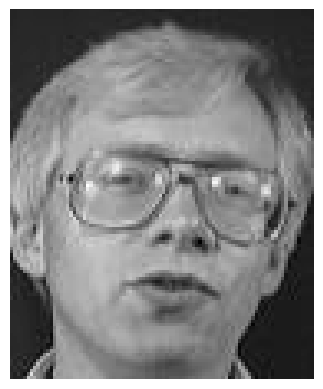

In [205]:
# sampel data uji

dataTest = plt.imread('/Users/iamapinn/Developer/UTS Pengolahan CITRA/ORL/2/ORL_2_6.jpg').astype('double')
dataTest = np.array(dataTest)

plt.imshow(dataTest, cmap='gray')
plt.axis('off')
plt.show()


In [206]:
# ubah dataTest menjadi 1 Dimensi
dataTestFlat = dataTest.flatten()

In [207]:
# Menghitung bobot testing
bobotTesting = np.dot(dataTestFlat, proyeksiMatrix)

In [208]:
# Menghitung jarak dengan Manhattan
kelasTest, poseTest = Manhattan(bobotMatrix, bobotTesting, 6)

In [209]:
print('Hasil orang ke-', kelasTest, 'pose ke-', poseTest)

Hasil orang ke- 1 pose ke- 2


In [210]:
print(train[0][1])

53


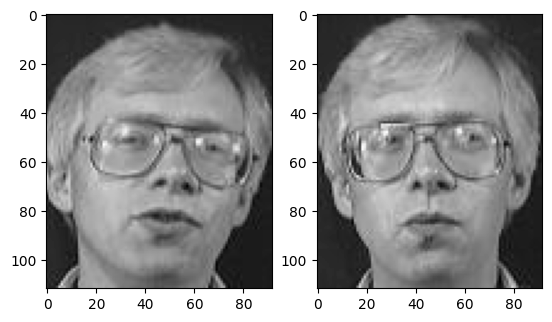

In [211]:
f = plt.figure()
f.add_subplot(1, 2, 1)
plt.imshow(dataTest, cmap='gray')
f.add_subplot(1, 2, 2)
plt.imshow(datasetFaces[kelasTest][poseTest], cmap='gray')
plt.show()